In [1]:
import pandas as pd
import numpy as np
import pandas as pd
from configparser import ConfigParser
import numpy as np
import spacy
import re
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import sys
get_ipython().system('{sys.executable} -m pip install yellowbrick')


You should consider upgrading via the '/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [3]:
tweetsDF = pd.read_csv("/Users/xiaohuili/Xiaohui/Career/MBA/Workshops/Deloitte Data Analytics/Final Project/NY_data.csv")
tweetsDF

,ID,Location,Processed_Tweet,state
0,2.742637e+08,ny,"fuck mitch , putin puppet ! make donation ...",NY
1,1.203309e+18,new york,"cate people employ , u decide home early.the w...",NY
2,8.318767e+17,new york,buy 80 12 pack corona 1200 $,NY
3,1.176033e+18,new york,look answer ? wonder nation struggle right com...,NY
4,1.259534e+18,new york,"local : "" great ! "" - "" , ? "" - # coronavi...",NY
...,...,...,...,...
1909087,3.380865e+08,ny,"negotiation pause amid covid-19 pandemic , typ...",NY
1909088,8.424264e+17,new york,people allow bear right corona stuff go ?,NY
1909089,1.884728e+08,new york,real panic 9 month ... well fat corona baby ! ...,NY
1909090,3.714128e+08,new york,"haha , fact hate rally presser today . doubt...",NY


In [4]:
tweetsDF['Processed_Tweet'] = tweetsDF['Processed_Tweet'].replace(r'http\S+', "", regex=True).replace(r'www\S+', "", regex=True)
tweetsDF

,ID,Location,Processed_Tweet,state
0,2.742637e+08,ny,"fuck mitch , putin puppet ! make donation ...",NY
1,1.203309e+18,new york,"cate people employ , u decide home early.the w...",NY
2,8.318767e+17,new york,buy 80 12 pack corona 1200 $,NY
3,1.176033e+18,new york,look answer ? wonder nation struggle right com...,NY
4,1.259534e+18,new york,"local : "" great ! "" - "" , ? "" - # coronavi...",NY
...,...,...,...,...
1909087,3.380865e+08,ny,"negotiation pause amid covid-19 pandemic , typ...",NY
1909088,8.424264e+17,new york,people allow bear right corona stuff go ?,NY
1909089,1.884728e+08,new york,real panic 9 month ... well fat corona baby ! ...,NY
1909090,3.714128e+08,new york,"haha , fact hate rally presser today . doubt...",NY


In [5]:
is_NY =  tweetsDF['state']=='NY'
NY_DF = tweetsDF[is_NY]
NY_DF

,ID,Location,Processed_Tweet,state
0,2.742637e+08,ny,"fuck mitch , putin puppet ! make donation ...",NY
1,1.203309e+18,new york,"cate people employ , u decide home early.the w...",NY
2,8.318767e+17,new york,buy 80 12 pack corona 1200 $,NY
3,1.176033e+18,new york,look answer ? wonder nation struggle right com...,NY
4,1.259534e+18,new york,"local : "" great ! "" - "" , ? "" - # coronavi...",NY
...,...,...,...,...
1909087,3.380865e+08,ny,"negotiation pause amid covid-19 pandemic , typ...",NY
1909088,8.424264e+17,new york,people allow bear right corona stuff go ?,NY
1909089,1.884728e+08,new york,real panic 9 month ... well fat corona baby ! ...,NY
1909090,3.714128e+08,new york,"haha , fact hate rally presser today . doubt...",NY


In [6]:
# Removing stop words
import en_core_web_sm
nlp = en_core_web_sm.load()

In [7]:
NY_DF["Processed_Tweet"] = NY_DF["Processed_Tweet"].astype(str)

In [8]:
def pre_pipe(doc_tweets):
    tweet_lemm = ' '.join(token.lemma_ for token in doc_tweets if not (token.is_stop or token.lemma_ == '-PRON-'))
    t_pos = ','.join(token.pos_ for token in doc_tweets if not (token.is_stop or token.lemma_ == '-PRON-'))
    return tweet_lemm, t_pos

def processing_pipe(raw_tweets):
    covid_tweets=[]
    pos=[]
    t_num = 1
    # it's performant to use 'nlp.pipe' since it allows for multi-threaded batch processing of individual tweets or 'docs'
    for doc in nlp.pipe(raw_tweets, batch_size=7500, disable=["parser"]): # batch_size dependent on system CPU/RAM
        covid_tweets.append(pre_pipe(doc)[0])
        pos.append(pre_pipe(doc)[1])
        t_num += 1
    return covid_tweets, pos


In [9]:
t_clean = processing_pipe(NY_DF['Processed_Tweet'])

NY_DF['Tweet'] = pd.Series(t_clean[0][:])
NY_DF['POS'] = pd.Series(t_clean[1][:])

print('Tweets processed, POS added, removing original tweet column...')

try:
    NY_DF['Processed_Tweet'].replace('', np.nan, inplace=True) 
    NY_DF=NY_DF.dropna()
except:
    raise
print('Tweets removed.')

Tweets processed, POS added, removing original tweet column...
Tweets removed.


Tweets appended to single string.
Generating WordCloud across 147920903 characters.
WordCloud generated and displaying...


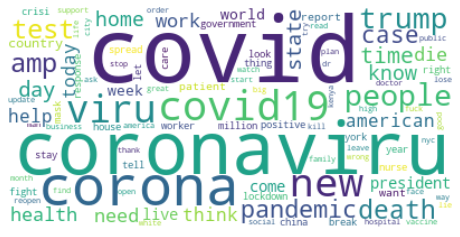

In [12]:
# Create word cloud
df_NY = NY_DF['Tweet'].to_list()
r_tweet = " ".join(df_NY)
print('Tweets appended to single string.')
# Create a basic wordcloud
print(f'Generating WordCloud across {len(r_tweet)} characters.')
wordcloud = WordCloud(background_color="white", collocations=False, max_words=100).generate(r_tweet)
print('WordCloud generated and displaying...')
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
# Covid, covid19, corona, viru, coronaviru, big, month
# time, today, hear, look, tell, thing, week, may, amp, want, come, remove

#know, think, read

In [13]:
nlp = spacy.load('en_core_web_sm')

In [ ]:
t_clean

In [14]:
from pandas import DataFrame
NY = DataFrame(df_NY,columns=['Tweet'])
total_tweets = len(NY.index)

In [15]:
NY = NY.replace('[^A-Za-z0-9 ]+','', regex=True)

In [16]:
### Build a word count line graph to explore density of the terms
print('Pulling out indivdual words.')
all_words = []
for line in NY['Tweet']:
    words = line.split()
    for word in words:
        all_words.append(word.lower())
print('Words extracted.')
print(all_words[:40])

Pulling out indivdual words.
Words extracted.
['fuck', 'mitch', 'putin', 'puppet', 'donation', 'sure', 'retire', 'cate', 'people', 'employ', 'u', 'decide', 'home', 'earlythe', 'way', 'fight', 'corona', 'lockdownsimpleone', 'pt', 'heal', 'indicate', 'as', 'tweet', 'virus', 'spreadingas', 'long', 'people', 'virus', 'spread', 'buy', '80', '12', 'pack', 'corona', '1200', 'look', 'answer', 'wonder', 'nation', 'struggle']


In [17]:
word_count = Counter(all_words).most_common(1000)
word_count_x = []
word_count_y = []
for word, count in word_count:
    word_count_x.append(word)
    word_count_y.append(count)

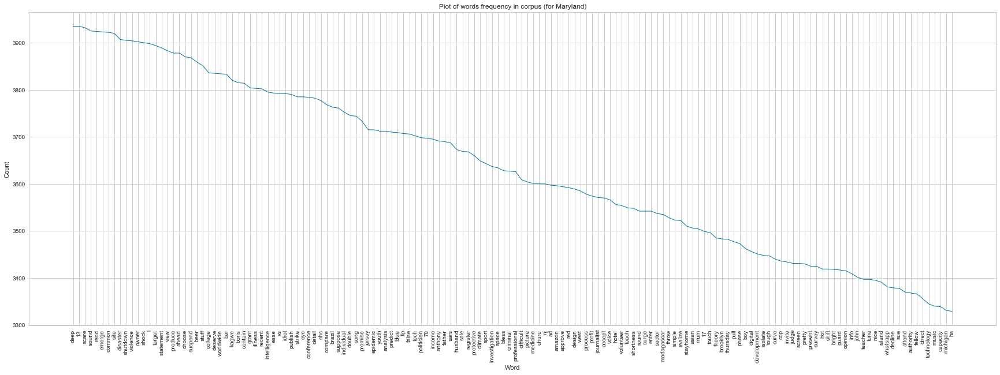

In [18]:
plt.figure(figsize=(30,10))
plt.plot(word_count_x[850:], word_count_y[850:], linestyle='-', linewidth=1) # play around with the values within x and y to slice the data differently
plt.ylabel("Count")
plt.xlabel("Word")
plt.xticks(rotation=90)
plt.title('Plot of words frequency in corpus (for Maryland)')
plt.show()

In [19]:
### TDM and TF-IDF
#Using - bi-frams and min occurance as 10

vect = CountVectorizer(ngram_range=(2,2), min_df=10, stop_words=['fuck', 'shit', 'ass'])
tfidf_vect = TfidfVectorizer(ngram_range=(2,2), min_df=10, stop_words=['fuck', 'shit', 'ass'])

In [20]:
#Fitting across out tweets
tdm_data = vect.fit_transform(NY['Tweet'])
tfidf_data = tfidf_vect.fit_transform(NY['Tweet'])
tdm_columns = vect.get_feature_names()
tfidf_columns = tfidf_vect.get_feature_names()

In [21]:
#printing matices stats
print(f'Number of TDM features: {len(tdm_columns)}') 
print(f'Number of TF-IDF features: {len(tfidf_columns)}')
print(f'TDM data: {tdm_data[:3288].toarray()}')
print(f'TDM data: {tfidf_data[:3288].toarray()}')

Number of TDM features: 226433
Number of TF-IDF features: 226433
TDM data: [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
TDM data: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [22]:
### K-means
#Further cleaning the tweets
def clean_text(text):
    #remove RT @user and QT @user
    cleaned = re.sub(r'RT @([A-Za-z]+[A-Za-z0-9-_]+):','',text)
    cleaned = re.sub(r'QT @([A-Za-z]+[A-Za-z0-9-_]+):','',cleaned)
    #remove @user
    cleaned = re.sub(r'@([A-Za-z]+[A-Za-z0-9-_]+)','',cleaned)

    #remove multiple spaces
    cleaned = re.sub('\s+', ' ', cleaned)
    
    #removing single alphabets
    cleaned =  re.sub(r'\b\w\b','',cleaned)

    #make everything lowercase
    lower_text = cleaned.lower()

    #separate hypenated words
    separate = lower_text.split('-')
    combined = ' '.join(separate)

    #strip beginning and ending whitespace
    clean_spaces = combined.strip()
    return clean_spaces

def clean_emojis(string):
    return string.encode('ascii', 'ignore').decode('ascii')


In [23]:
NY['Clean_Tweet'] = NY['Tweet'].apply(clean_text)

In [24]:
NY

,Tweet,Clean_Tweet
0,fuck mitch putin puppet donation sure ...,fuck mitch putin puppet donation sure retire
1,cate people employ u decide home earlythe way...,cate people employ decide home earlythe way f...
2,buy 80 12 pack corona 1200,buy 80 12 pack corona 1200
3,look answer wonder nation struggle right comb...,look answer wonder nation struggle right comba...
4,local great coronaviru covid...,local great coronaviru covid19 sarscov2 news
...,...,...
1909087,negotiation pause amid covid19 pandemic type ...,negotiation pause amid covid19 pandemic type a...
1909088,people allow bear right corona stuff,people allow bear right corona stuff
1909089,real panic 9 month fat corona baby ijs min...,real panic month fat corona baby ijs mindyamo...
1909090,haha fact hate rally presser today doubt ...,haha fact hate rally presser today doubt tange...


In [25]:
#increasing the minimum occurances to 30

NY_tweets = NY['Clean_Tweet'].tolist()
vectorizer = TfidfVectorizer(ngram_range=(2,2), min_df=30)
X = vectorizer.fit_transform(NY_tweets)

Running K-mean elbow diagram


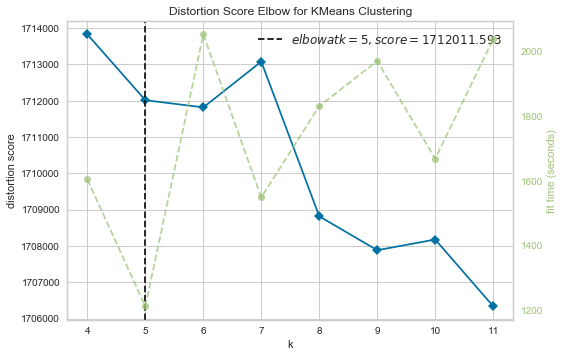

In [26]:
print('Running K-mean elbow diagram')
model = KMeans()
visualizer = KElbowVisualizer(model, k=(4,12))
visualizer.fit(X)
visualizer.show()

In [86]:
# Appropriate number of clusters in this case is 5
Number_Clusters=5
kmeans = KMeans(n_clusters=Number_Clusters, random_state=0).fit(X)

In [87]:
Cluster_Labels=kmeans.labels_.tolist()

In [88]:
data={'Tweet':NY_tweets,'Cluster_Number':Cluster_Labels}
df_10=pd.DataFrame(data)
df_10

,Tweet,Cluster_Number
0,upset wellness grifter advantage corona sell d...,0
1,want illinois citizen cross state line covid19...,0
2,facebook commercial feature post inspirational...,0
3,corona officially day week1 yesterday today3 ...,0
4,generation want folk love everybody 40 millen...,0
...,...,...
391903,serbian president dystopian creepy political r...,0
391904,west hospital coronavirus patient intubate out...,0
391905,report sorry numb bbc1 google turn art,0
391906,listen now11am 580 follow,0


In [96]:
Actual_Clusters_Ordered=[[n  for n in range(len(Cluster_Labels)) if(Cluster_Labels[n]==i)]
                         for i in range(Number_Clusters)]

In [ ]:
for i in range(len(Actual_Clusters_Ordered)):
    for n in range(len(Actual_Clusters_Ordered[i])):
        String="Cluster_Name_"+str(i)
        print(NY_tweets[Actual_Clusters_Ordered[i][n]],String)


upset wellness grifter advantage corona sell dangerous garbageyou thank th Cluster_Name_0
want illinois citizen cross state line covid19 send constructio Cluster_Name_0
facebook commercial feature post inspirational coronavirus group little uplift Cluster_Name_0
corona officially day week1 yesterday  today3 tomorrow Cluster_Name_0
generation  want folk love everybody 40 millennialsmillennial Cluster_Name_0
shut fuck lol Cluster_Name_0
leftist voter fraudtrump leftist push vote mail fraudpresid Cluster_Name_0
2nd wave covid19 stretch outfit lie bed ready Cluster_Name_0
come corona barista Cluster_Name_0
thank broadwayreliefproject ingenuity help healthcare worker surgical gown need covid19 Cluster_Name_0
mommy die week bc corona funeral 10 people need help Cluster_Name_0
let face cdc admittedly list disease sun coronavirus death hide complete Cluster_Name_0
round trump national golf club sterling va instead oversee covid19 crisis white house situation room Cluster_Name_0
cult member Clu

In [98]:
a = pd.Series(Cluster_Labels) 
a.value_counts()

0    375906
1     14367
4       665
2       571
3       399
dtype: int64

In [91]:
from sklearn.decomposition import TruncatedSVD # to work with sparse matrices
from sklearn.preprocessing import normalize
from sklearn.metrics import pairwise_distances

In [92]:
sk_tsvd = TruncatedSVD(n_components= 2)
y_tsvd = sk_tsvd.fit_transform(X)
svd = TruncatedSVD(n_components=2, n_iter=7, random_state=42)
svd.fit(X)

TruncatedSVD(algorithm='randomized', n_components=2, n_iter=7, random_state=42,
             tol=0.0)

In [93]:
kmeans.fit(y_tsvd)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [94]:
svd_clusters = kmeans.predict(y_tsvd)
svd_clusters

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

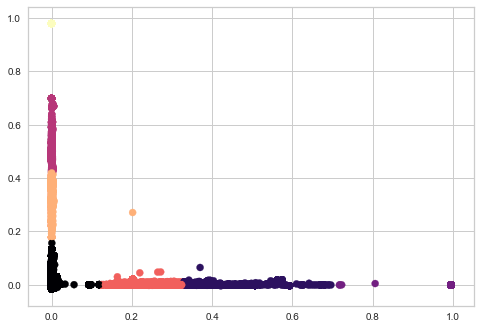

In [85]:
plt.scatter(y_tsvd[:, 0], y_tsvd[:, 1], c=svd_clusters, s=50, cmap='magma')
plt.show()